# Imports

In [90]:
path = "/content/drive/MyDrive/MVA/Projet Remote Sensing/MVA_project_bananiers/"
path_gfleuve = path + 'Grand_Fleuve'
path_foret = path + 'forest_segmentation'

In [91]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [92]:
! pip install rasterio
! pip install fastkml
! pip install shapely
! pip install scikit-image

In [105]:
import rasterio
import numpy as np
import os
import rasterio.mask
import rasterio.warp
import matplotlib.pyplot as plt

from fastkml import kml
from shapely.geometry import mapping

from skimage.segmentation import slic, quickshift, felzenszwalb
from sklearn.cluster import KMeans

In [94]:
try:
    from google.colab import files
    !pip install -q hdf5storage

    !rm -fr MVAdenoising
    !git clone --quiet https://github.com/gfacciol/MVAdenoising
    !cp -r MVAdenoising/* .

except ImportError:
    # %matplotlib notebook
    pass


from helpers import *
from vistools import *

category_values= {'NoData': 0,
 'No Vegetation': 1,
 'Low vegetation': 2,
 'Medium Vegetation': 3,
 'Palm oil crops': 4,
 'Forest': 5,
 'Uniform vegetation': 6,
 'Water bodies': 7,
 'Plantations': 8}
category_values_lower = {k.lower(): v for k,v in category_values.items()}

^C
cp: cannot stat 'MVAdenoising/*': No such file or directory


# Traitement des images

### Afficher une image

In [95]:
def normalize_img(img):
    return (img - np.nanmin(img))/(np.nanmax(img) - np.nanmin(img))

In [96]:
os.chdir(path_foret)

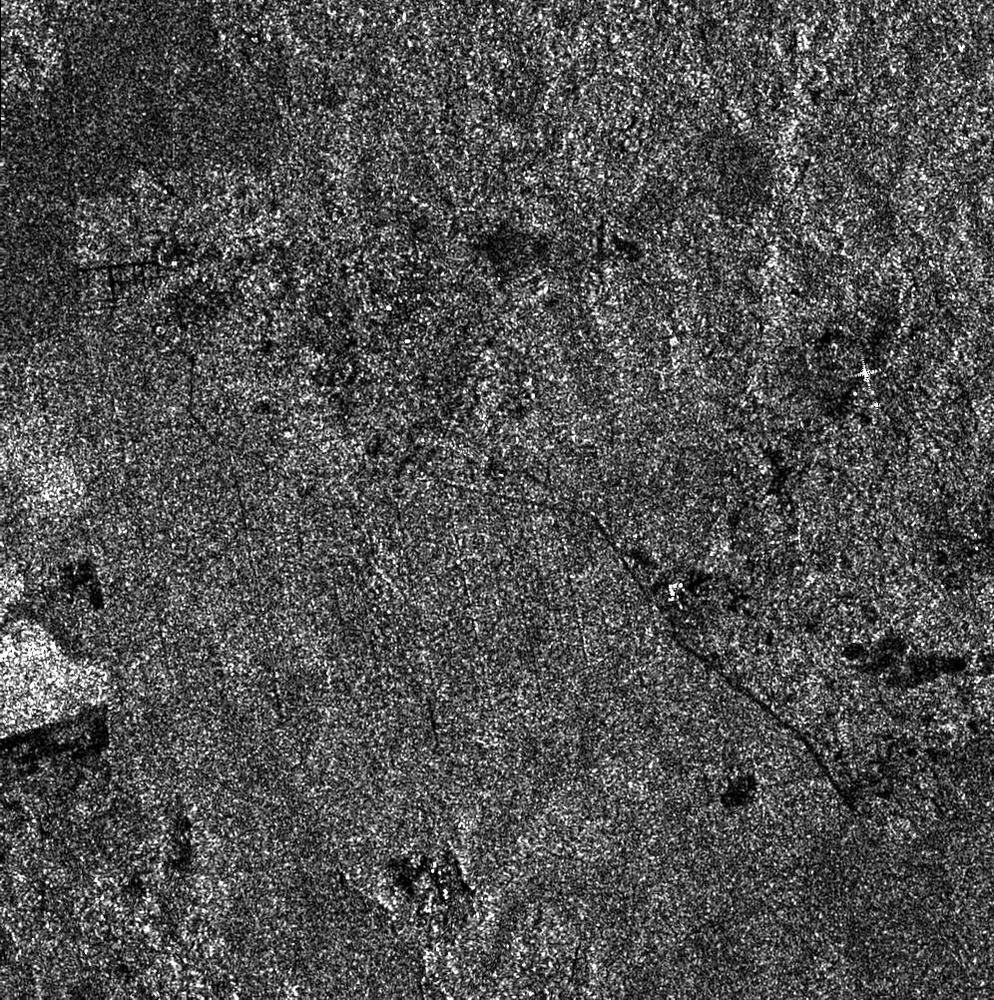

In [97]:
fname = 'Site_001/s1/2019-01-14T18_33_37Z/iw-vh.tiff'

with rasterio.open(fname) as src:
    img = src.read()
    img = img.transpose([1,2,0]).astype(float)
    img[img > np.nanpercentile(img,99)] = np.nanpercentile(img,99)
    img[img < np.nanpercentile(img,1)] = np.nanpercentile(img,1)
    img_norm = normalize_img(img)*255
    
display_image(img_norm)


In [98]:
img_norm = img_norm.squeeze()

Remove nan values

In [99]:
def conv_mapping(x):
    """
    When the fifth value (x[4]) of the filter array (the center of the window) 
    is null, replace it with the mean of the surrounding values.
    """
    if np.isnan(x[4]) and not np.isnan(np.delete(x, 4)).all():
        return np.nanmean(np.delete(x, 4))
    else:
        return x[4]


from scipy import ndimage
mask = np.ones((3, 3))

In [100]:
img_norm_inpainted = ndimage.generic_filter(img_norm, function=conv_mapping, footprint=mask, mode='constant', cval=np.NaN)

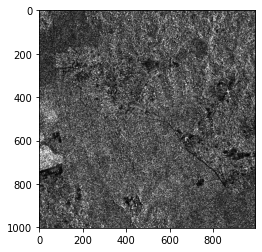

In [101]:
plt.imshow(img_norm_inpainted,cmap='gray')

In [102]:
np.save('Site_001/s1/2019-01-14T18_33_37Z/iw-vh_v3.npy', img_norm_inpainted)

### Débruitage
On regroupe les images d'un même trimestre ensemble pour ensuite pouvoir moyenner

In [19]:
import os 
import shutil
img_dir = path_foret + '/Site_001/s1'

# list_years = []

# for dir in os.listdir(img_dir):
#     print(dir)
#     year, month, _ = dir.split('-')
#     if year not in list_years:
#         list_years.append(year)

# for year in sorted(list_years) :
#     os.mkdir(os.path.join(img_dir,'T1_'+year))
#     os.mkdir(os.path.join(img_dir,'T2_'+year))
#     os.mkdir(os.path.join(img_dir,'T3_'+year))
#     os.mkdir(os.path.join(img_dir,'T4_'+year))

# for dir in os.listdir(img_dir):
#     #Permet simplement de ne considérer que les dossiers qui contiennent des images et non ceux des trimestres créés juste avant 
#     if dir.endswith('Z'):
#         year, month, _ = dir.split('-')
#         if int(month) <4:
#             shutil.copytree(os.path.join(img_dir, dir), os.path.join(img_dir, 'T1_'+year, dir))
#         elif int(month) >3 and int(month) <7:
#             shutil.copytree(os.path.join(img_dir, dir), os.path.join(img_dir, 'T2_'+year, dir))
#         elif int(month) >6 and int(month) <10:
#             shutil.copytree(os.path.join(img_dir, dir), os.path.join(img_dir, 'T3_'+year, dir))
#         else :
#             shutil.copytree(os.path.join(img_dir, dir), os.path.join(img_dir, 'T4_'+year, dir))

T1 2019 VH


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: Mean of empty slice


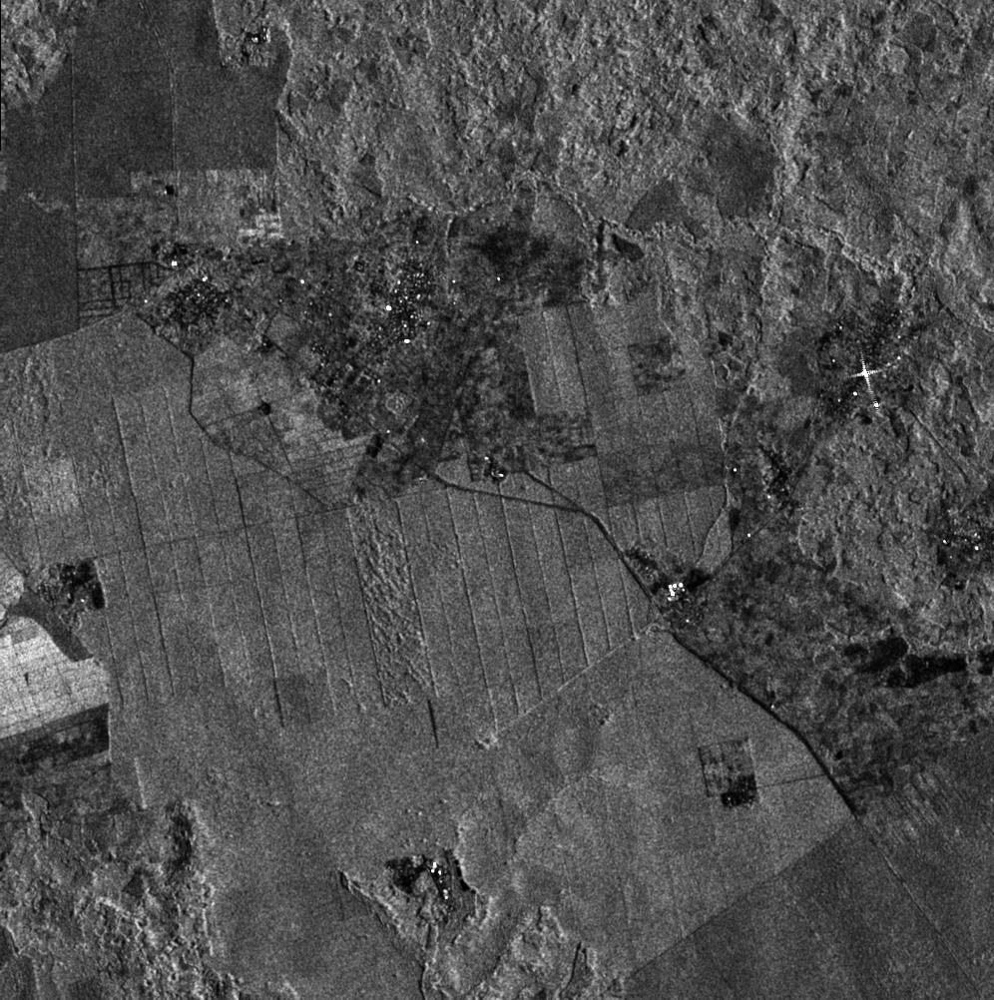

T1 2019  VV


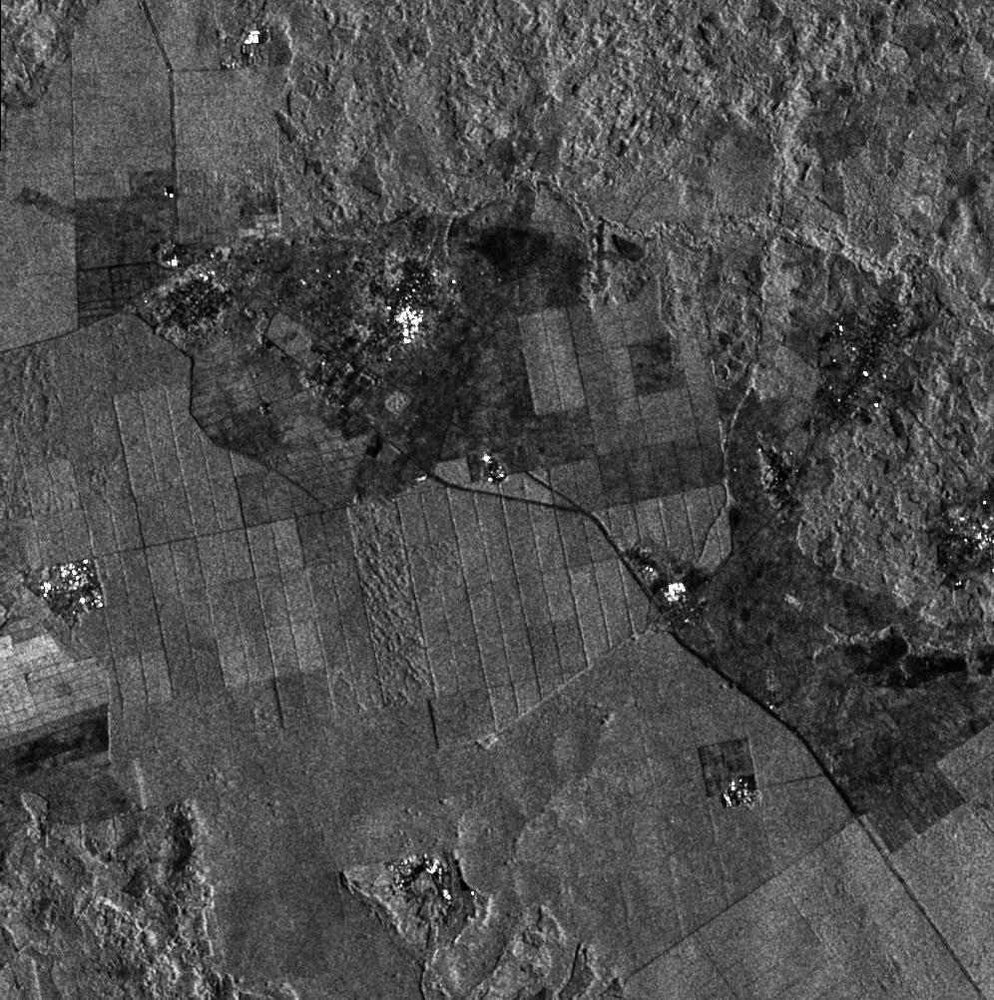

In [103]:
def compute_mean_img(img_dir, trimester, year, polar = 'VH', display=False):
    '''
    trimester : T1, T2, T3, T4
    '''
    year = str(year)
    list_img = []
    for dir in os.listdir(os.path.join(img_dir,trimester +'_'+year)):
        for file in os.listdir(os.path.join(os.path.join(img_dir,trimester +'_'+year), dir)):
            if polar == 'VH':
                fname = os.path.join(os.path.join(img_dir,trimester +'_'+year), dir, 'iw-vh.tiff')
            elif polar == 'VV':
                fname = os.path.join(os.path.join(img_dir,trimester +'_'+year), dir, 'iw-vv.tiff')
            with rasterio.open(fname) as src:
                img = src.read()
                img = img.transpose([1,2,0]).astype(float)
                img[img > np.nanpercentile(img,99)] = np.nanpercentile(img,99)
                img[img < np.nanpercentile(img,1)] = np.nanpercentile(img,1)
                img_norm = (normalize_img(img)*255)
                list_img.append(img_norm)
                average_image = np.nanmean(list_img, axis=0)
    if display:
        display_image(average_image)
    return average_image

year = 2019
print('T1', year, 'VH')
averaged_image_VH = compute_mean_img(img_dir, 'T1', year, polar = 'VH', display=True)[:,:,0]

print('T1', year, ' VV')
averaged_image_VV = compute_mean_img(img_dir, 'T1', year, polar = 'VV', display=True)[:,:,0]

img_shape = averaged_image_VH.shape

### Define coloured images

Use VH and VV to build an image RGB with coherent colors (VV, VH, VV/VH)  

In [81]:
from skimage import color

image_s1_colored = np.zeros([averaged_image_VV.shape[0],averaged_image_VV.shape[1],3])
image_s1_colored[:,:,0] = normalize_img(averaged_image_VV)
image_s1_colored[:,:,1] = normalize_img(averaged_image_VH)
image_s1_colored[:,:,2] = normalize_img(averaged_image_VV/(averaged_image_VH  + 1e-10))

grey_img = color.rgb2gray(image_s1_colored)

Text(0.5, 1.0, 'Greyscale')

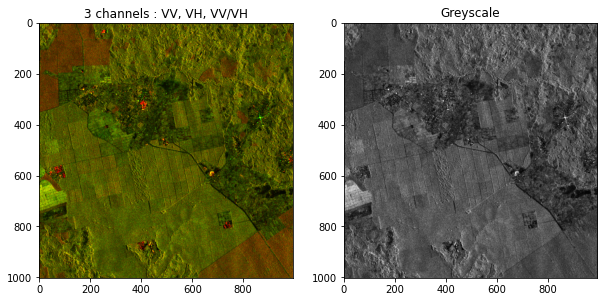

In [85]:
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1,2,1)
ax1.imshow(image_s1_colored, cmap='gray')
ax1.set_title('3 channels : VV, VH, VV/VH')

ax2 = fig.add_subplot(1,2,2)
ax2.imshow(grey_img, cmap='gray')
ax2.set_title('Greyscale')

# Segmentation

### Détection de contours avec le gradient

In [ ]:
from skimage import io as skio
from skimage import measure
import skimage.morphology as morpho
from scipy import signal

def strel(forme, taille, angle = 45):
    if forme == 'diamond' : 
        return morpho.selem.diamond(taille)
    if forme == 'disk' : 
        return morpho.selem.disk(taille)
    if forme == 'square' : 
        return morpho.selem.square(taille)   
    raise RuntimeError('Erreur dans fonction strel : forme incomprise.')
    
def filtrer_grad_classique(image) :
    #Cette fonction renvoie le gradient de l'image en utilisant le filtre de Sobel
    element = strel("disk", np.floor(3))
    image = morpho.closing(morpho.opening(image,element),element)
    masqueX = [[-1,0,1],[-1,0,1],[-1,0,1]] 
    masqueY = [[-1,-1,-1],[0,0,0],[1,1,1]] 
    x=np.absolute(signal.convolve2d(image, masqueX,"same"))
    y=np.absolute(signal.convolve2d(image, masqueY,"same"))
    return (np.sqrt(x**2 + y**2))

def filtrer_grad_morpho(image):
    #Cette fonction calcule le gradient morphologique de l'image
    element = strel("disk", np.floor(5))
    image = morpho.closing(morpho.opening(image,element),element)
    elmt = strel("disk",np.floor(5))
    grad = morpho.dilation(image,elmt)-morpho.erosion(image,elmt)
    return grad

Text(0.5, 1.0, 'Gradient morphologique')

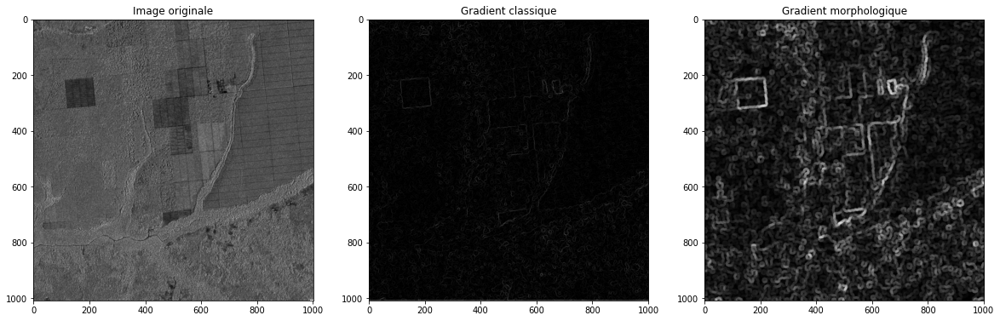

In [ ]:
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_subplot(1,3,1)
ax1.imshow(grey_img,cmap='gray')
ax1.set_title("Image originale")

ax2 = fig.add_subplot(1,3,2)
ax2.imshow(filtrer_grad_classique(grey_img),cmap='gray')
ax2.set_title("Gradient classique")

ax3 = fig.add_subplot(1,3,3)
ax3.imshow(filtrer_grad_morpho(grey_img),cmap='gray')
ax3.set_title("Gradient morphologique")

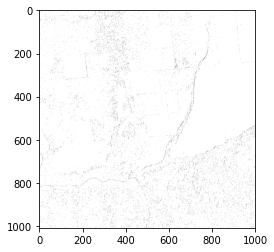

In [ ]:
import cv2
def sobel(image):
  sobelx= np.absolute(cv2.Sobel(image, 0, dx=1, dy=0))
  sobely= np.absolute(cv2.Sobel(image, 0, dx=0, dy=1))
  morpho = np.absolute(filtrer_grad_morpho(image))
  return sobelx + sobely + morpho


threshold = 0
grad = 255 - np.uint8(sobel(grey_img)) #np.array(filtrer_grad_morpho(grey_img), dtype=np.uint8)
# element = strel("disk", np.floor(2))
# grad = morpho.closing(morpho.opening(grad,element),element)
# grad[grad<threshold]=0
# grad[grad>threshold] = 255
plt.imshow(grad, cmap='gray')

#### Watershed

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  # This is added back by InteractiveShellApp.init_path()


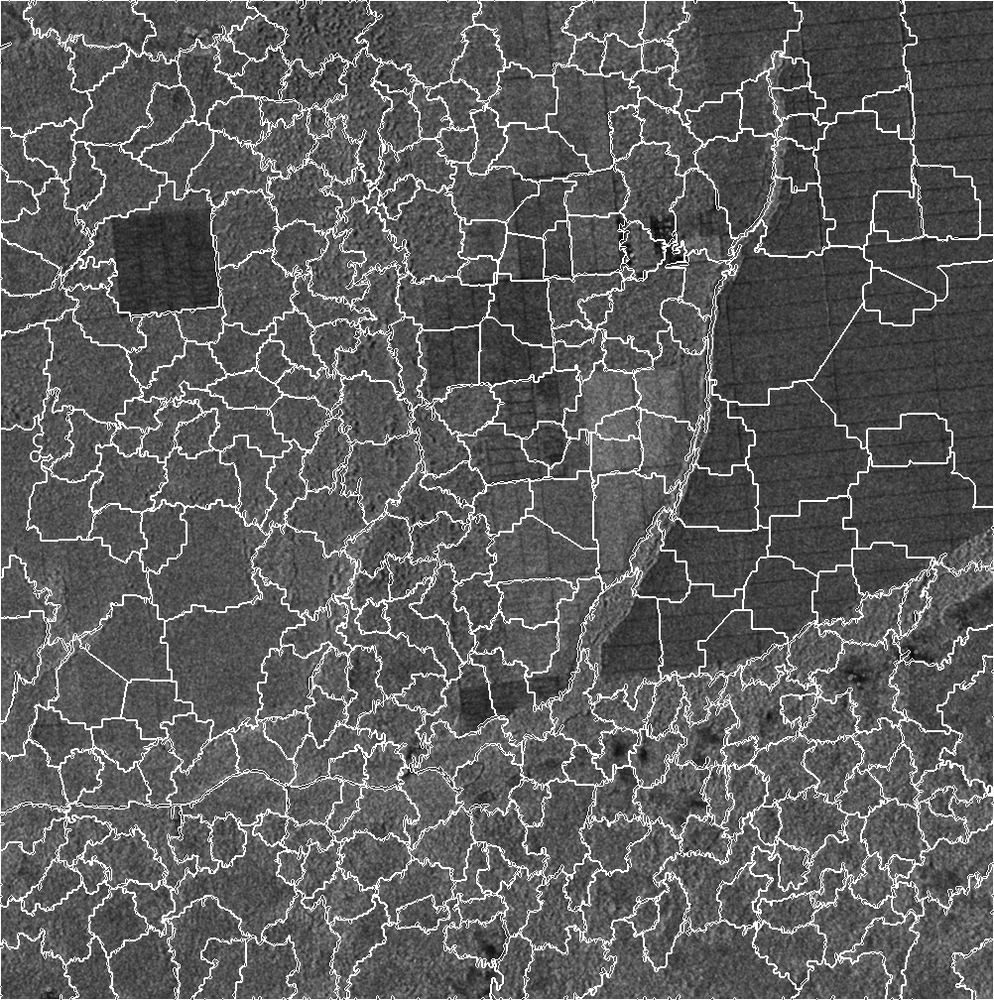

In [ ]:
import cv2
from skimage.feature import peak_local_max
from skimage.segmentation import watershed
from scipy import ndimage
from google.colab.patches import cv2_imshow

# Compute Euclidean distance from every binary pixel
# to the nearest zero pixel then find peaks
thresh = cv2.threshold(grad, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
distance_map = ndimage.distance_transform_edt(thresh)
local_max = peak_local_max(distance_map, indices=False, min_distance=20)

# Perform connected component analysis then apply Watershed
markers = ndimage.label(local_max, structure=np.ones((3, 3)))[0]
labels = watershed(-distance_map, markers, mask=thresh, compactness=0.01)

image = averaged_image_VH.copy()
# Iterate through unique labels
total_area = 0
for label in np.unique(labels):
    if label == 0:
        continue

    # Create a mask
    mask = np.zeros(grad.shape, dtype="uint8")
    mask[labels == label] = 255

    # Find contours and determine contour area
    cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    c = max(cnts, key=cv2.contourArea)
    cv2.drawContours(image, [c], -1, (255,0,0), 1)

cv2_imshow( image)

In [ ]:

# averaged_image_VV = ndimage.generic_filter(averaged_image_VV, function=conv_mapping, footprint=mask, mode='constant', cval=np.NaN)
# averaged_image_VH = ndimage.generic_filter(averaged_image_VH, function=conv_mapping, footprint=mask, mode='constant', cval=np.NaN)

### Kmean

In [ ]:
def remove_quantiles(img):
    img[img > np.nanpercentile(img,99)] = np.nanpercentile(img,99)
    img[img < np.nanpercentile(img,1)] = np.nanpercentile(img,1)
    return img

Text(0.5, 0, 'RVI')

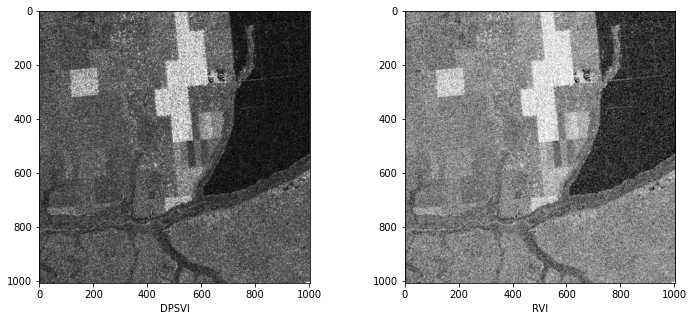

In [ ]:
rvi = (4*averaged_image_VH)/(averaged_image_VV+averaged_image_VH)
DPSVI = (averaged_image_VV+averaged_image_VH)/averaged_image_VV
fig = plt.figure(figsize=(12, 5))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax1.imshow(255*normalize_img(remove_quantiles(DPSVI)), cmap='gray')
ax1.set_xlabel('DPSVI')
ax2.imshow(255*normalize_img(remove_quantiles(rvi)), cmap='gray')
ax2.set_xlabel('RVI')

In [ ]:
cluster_colors = np.array([[255,0,0], [0,100,0], [0,255,0], [0,0,255], [200,0,255], [255,255,0], [0,255,255], [100,100,100]])

def kmeans_clustering(images, k=8, cluster_colors = cluster_colors):
    pixel_values = np.float32(images)
    # define stopping criteria
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    # number of clusters (K)
    _, labels, (centers) = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

    #
    if k > 8 :
        cluster_colors = np.array([np.random.randint(0,255,3) for _ in range(k)], dtype=np.uint8).reshape(-1, 3) #Colors for each class

    cluster_colors = cluster_colors[:k,:]

    # flatten the labels array
    labels = labels.flatten()

    # convert all pixels to the color of the centroids
    segmented_images = cluster_colors[labels]

    # reshape back to the original image dimension
    segmented_image = segmented_images.reshape((img_shape[0], img_shape[1], 3))

    return segmented_image

images = np.array([averaged_image_VH.squeeze().ravel(), averaged_image_VV.squeeze().ravel()], dtype=np.uint8).T
pixel_clustering = kmeans_clustering(images, k=8)

Text(0.5, 1.0, 'Segmentation of pixels')

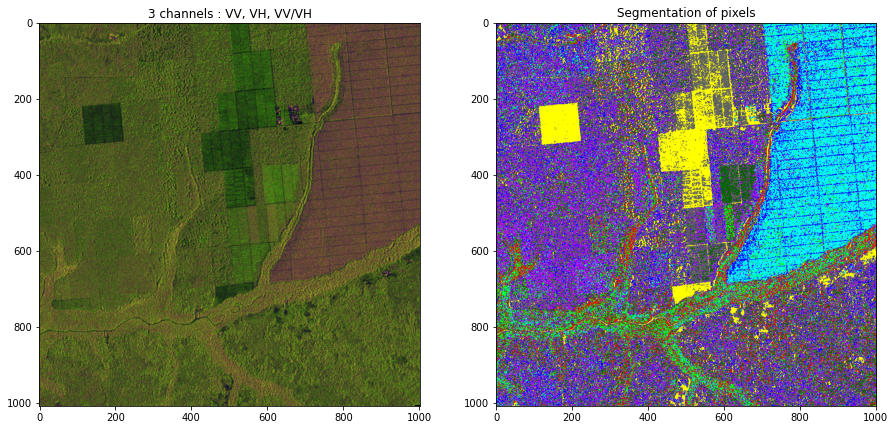

In [ ]:
fig = plt.figure(figsize=(15,15))
ax1 = fig.add_subplot(1,2,1)
ax1.imshow(image_s1_colored,cmap='gray')
ax1.set_title('3 channels : VV, VH, VV/VH')

ax2 = fig.add_subplot(1,2,2)
ax2.imshow(pixel_clustering)
ax2.set_title("Segmentation of pixels")

## Using superpixels

#### Different superpixels methods


In [ ]:
from skimage.segmentation import slic, quickshift, felzenszwalb

slic_out = slic(image_s1_colored, n_segments=5000, compactness = 10)
print('Number of superpixels using SLIC: ',len(np.unique(slic_out)))

quickshift_out = quickshift(image_s1_colored, ratio=1.0, kernel_size=5, max_dist=10)
print('Number of superpixels using Quickshift: ',len(np.unique(quickshift_out)))

#Use the gradient of the image computed previously
grad = np.array(sobel(grey_img))
watershed_out = watershed(grad, markers=5000, compactness=0.00001)
print('Number of superpixels using Watershed: ',len(np.unique(watershed_out)))

fz_out = felzenszwalb(image_s1_colored, scale=10, sigma=1, min_size=50)
print('Number of superpixels using Felzenszwalb: ',len(np.unique(fz_out)))


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: skimage.measure.label's indexing starts from 0. In future version it will start from 1. To disable this warning, explicitely set the `start_label` parameter to 1.
  This is separate from the ipykernel package so we can avoid doing imports until


Number of superpixels using SLIC:  2105
Number of superpixels using Quickshift:  3557
Number of superpixels using Watershed:  5184
Number of superpixels using Felzenszwalb:  5731


Display the segmentations in RGB based on the average color of each superpixel

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.
/usr/local/lib/python3.7/dist-packages/i

Text(0.5, 1.0, 'Clustering obtained from Felzenszwalb')

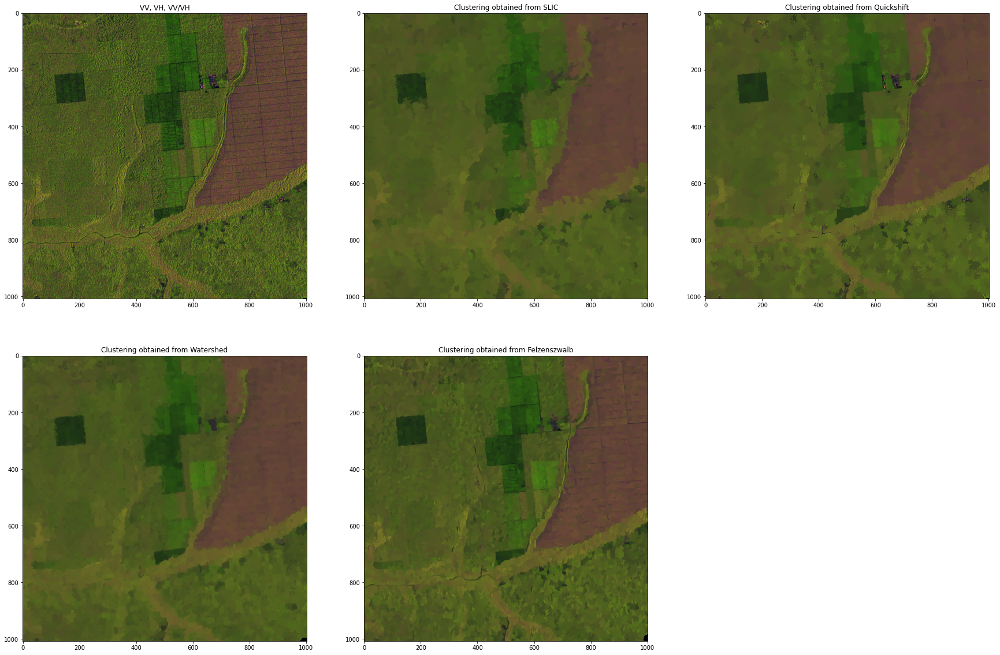

In [ ]:
import skimage.color as color

fig = plt.figure(figsize=(30,20))
ax1 = fig.add_subplot(2,3,1)
ax1.imshow(image_s1_colored)
ax1.set_title("VV, VH, VV/VH")

ax2 = fig.add_subplot(2,3,2)
slic_out_colored = color.label2rgb(slic_out, image_s1_colored, kind='avg')
ax2.imshow(slic_out_colored,cmap='gray')
ax2.set_title("Clustering obtained from SLIC")


ax3 = fig.add_subplot(2,3,3)
quickshift_out_colored = color.label2rgb(quickshift_out, image_s1_colored, kind='avg')
ax3.imshow(quickshift_out_colored,cmap='gray')
ax3.set_title("Clustering obtained from Quickshift")

ax4 = fig.add_subplot(2,3,4)
watershed_out_colored = color.label2rgb(watershed_out, image_s1_colored, kind='avg')
ax4.imshow(watershed_out_colored,cmap='gray')
ax4.set_title("Clustering obtained from Watershed")

ax5 = fig.add_subplot(2,3,5)
fz_out_colored = color.label2rgb(fz_out, image_s1_colored, kind='avg')
ax5.imshow(fz_out_colored,cmap='gray')
ax5.set_title("Clustering obtained from Felzenszwalb")

#### Kmean on super pixels

Malgré l'impression d'avoir peu de clusters on a en réalité plusieurs centaines de clusters/superpixels. On veut donc regrouper les superpixels afin d'obtenir un nombre réduit de clusters dans la segmentation

Text(0.5, 1.0, 'Clustering obtained from SLIC \n after converting to RGB and back to gray')

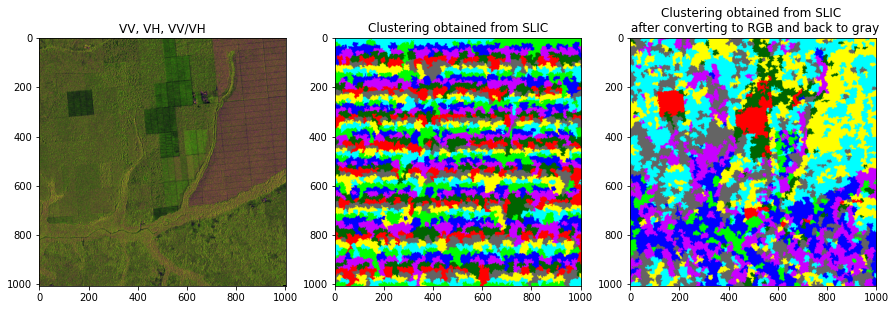

In [ ]:
slic_out_array = np.array([slic_out.squeeze().ravel()], dtype=np.uint8).T

#Convert SLIC in Gray
slic_out_gray = np.array(normalize_img(slic_out_colored)*255, dtype=np.uint8)
slic_out_gray = cv2.cvtColor(slic_out_gray, cv2.COLOR_BGR2GRAY)
slic_out_gray_array = np.array([slic_out_gray.squeeze().ravel()], dtype=np.uint8).T


slic_clustering = kmeans_clustering(slic_out_array,k=8)
slic_clustering_gray = kmeans_clustering(slic_out_gray_array,k=8)


fig = plt.figure(figsize=(15,15))
ax1 = fig.add_subplot(1,3,1)
ax1.imshow(image_s1_colored)
ax1.set_title("VV, VH, VV/VH")

ax2 = fig.add_subplot(1,3,2)
ax2.imshow(slic_clustering,cmap='gray')
ax2.set_title("Clustering obtained from SLIC")

ax3 = fig.add_subplot(1,3,3)
ax3.imshow(slic_clustering_gray,cmap='gray')
ax3.set_title("Clustering obtained from SLIC \n after converting to RGB and back to gray")


Il est nécessaire de recoloriser dans un premier temps les superpixels puis de reconvertir en nuances de gris afin d'obtenir un clustering pertinent. Voici ce qu'on obtient en utilisant un clustering KMeans sur les différentes segmentations obtenues via les algos de superpixels

In [ ]:
def process_segmentation(seg_colored):
    seg_colored_norm = np.array(normalize_img(seg_colored)*255, dtype=np.uint8)
    seg_gray = cv2.cvtColor(seg_colored_norm, cv2.COLOR_BGR2GRAY)
    seg_gray = np.array([seg_gray.squeeze().ravel()], dtype=np.uint8).T
    return seg_gray

Text(0.5, 1.0, 'Felzenszwalb + KMeans')

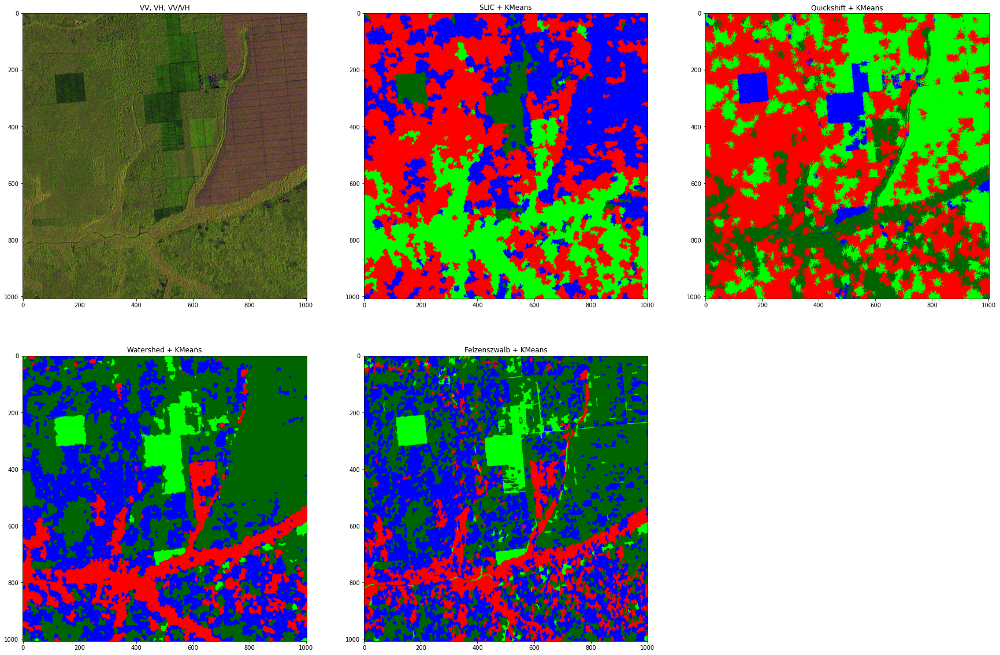

In [ ]:
import skimage.color as color

k=4

fig = plt.figure(figsize=(30,20))
ax1 = fig.add_subplot(2,3,1)
ax1.imshow(image_s1_colored)
ax1.set_title("VV, VH, VV/VH")

ax2 = fig.add_subplot(2,3,2)
slic_out_gray = process_segmentation(slic_out_colored) 
slic_kmeans = kmeans_clustering(slic_out_gray,k)
ax2.imshow(slic_kmeans,cmap='gray')
ax2.set_title("SLIC + KMeans")


ax3 = fig.add_subplot(2,3,3)
quickshift_out_gray = process_segmentation(quickshift_out_colored) 
quickshift_kmeans = kmeans_clustering(quickshift_out_gray,k)
ax3.imshow(quickshift_kmeans,cmap='gray')
ax3.set_title("Quickshift + KMeans")

ax4 = fig.add_subplot(2,3,4)
watershed_out_gray = process_segmentation(watershed_out_colored) 
watershed_kmeans = kmeans_clustering(watershed_out_gray,k)
ax4.imshow(watershed_kmeans,cmap='gray')
ax4.set_title("Watershed + KMeans")


ax5 = fig.add_subplot(2,3,5)
fz_out_gray = process_segmentation(fz_out_colored) 
fz_kmeans = kmeans_clustering(fz_out_gray,k)
ax5.imshow(fz_kmeans,cmap='gray')
ax5.set_title("Felzenszwalb + KMeans")

Comparison between the segmentation obtained considering only pixels versus superpixels

Text(0.5, 1.0, 'Segmentation of superpixels using FZ + KMeans')

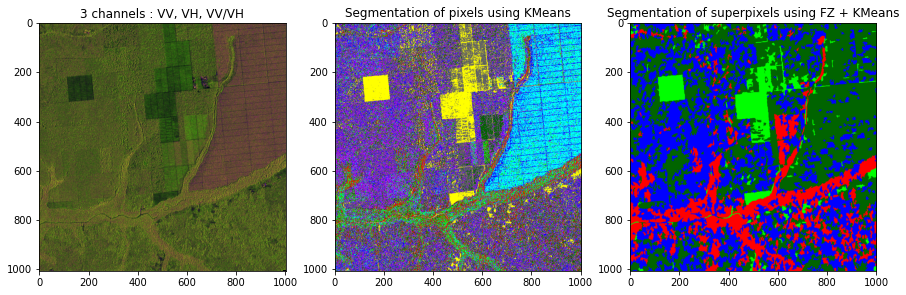

In [ ]:
fig = plt.figure(figsize=(15,15))
ax1 = fig.add_subplot(1,3,1)
ax1.imshow(image_s1_colored,cmap='gray')
ax1.set_title('3 channels : VV, VH, VV/VH')

ax2 = fig.add_subplot(1,3,2)
ax2.imshow(pixel_clustering)
ax2.set_title("Segmentation of pixels using KMeans")

ax3 = fig.add_subplot(1,3,3)
ax3.imshow(fz_kmeans)
ax3.set_title("Segmentation of superpixels using FZ + KMeans")

**A explorer :**



*   Autres méthodes de clustering après super pixels : spectral clustering, clustering hierarchique -> ne devrait plus faire sauter la RAM car beaucoup moins de pixels
*  Encore une fois aucun paramètre n'a été optimisé (notamment le nombre de superpixels qui joue un rôle majeur)







#### Spectral clustering

In [ ]:
from sklearn.cluster import KMeans
import networkx as nx

def d(x, y, var=1.0):
    return np.exp(-np.sum((x - y)**2)/(2 * var))

def build_similarity_graph(X, var=1.0, eps=0.8, k=0):
    """
    Computes the similarity matrix for a given dataset of samples. 
    If k=0, builds epsilon graph. 
    Otherwise, builds kNN graph.

    Build similarity graph, before threshold or kNN
    similarities: (n x n) matrix with similarities between all possible couples of points.
    The similarity function is d(x,y)=exp(-||x-y||^2/(2*var))

    Parameters
    ----------
    X : numpy array
        (n x m) matrix of m-dimensional samples
    var : double 
        the sigma value for the exponential function, already squared
    eps : double
        threshold for epsilon graphs
    k : int
        The number of neighbours k for k-nn. If zero, use epsilon-graph

    Returns
    -------
        W: (n x n) dimensional matrix representing the weight matrix of the graph
    """
    n = X.shape[0]
    W = np.zeros((n, n))

  
    similarities = np.zeros((n, n))
    for i in range(n):
        for j in range(i,n):
            x = X[i,:]
            y = X[j,:]
            similarities[i, j] = d(x, y, var)
            similarities[j, i] = similarities[i, j]
    # If epsilon graph
    if k == 0:
        """
        compute an epsilon graph from the similarities             
        for each node x_i, an epsilon graph has weights             
        w_ij = d(x_i,x_j) when w_ij >= eps, and 0 otherwise          
        """
        W = similarities.copy()
        W[W<eps] = 0
        W[np.diag_indices_from(W)] = 0

    # If kNN graph
    elif k != 0:
        """
        compute a k-nn graph from the similarities                   
        for each node x_i, a k-nn graph has weights                  
        w_ij = d(x_i,x_j) for the k closest nodes to x_i, and 0     
        for all the k-n remaining nodes                              
        Remember to remove self similarity and                       
        make the graph undirected                                    
        """
        for i in range(n):
            neighbors = np.argsort(-similarities[i,:])[1:k+1]
            for j in neighbors:
                W[i,j] = similarities[i,j]
                W[j,i] = similarities[i,j]
    return W

def build_laplacian(W, laplacian_normalization='unn'):
    """
    Compute graph Laplacian.

    Parameters
    ----------
    W : numpy array
        Adjacency matrix (n x n)
    laplacian_normalization : str
        String selecting which version of the laplacian matrix to construct.
            'unn':  unnormalized,
            'sym': symmetric normalization
            'rw':  random-walk normalization   

    Returns

    -------
    L: (n x n) dimensional matrix representing the Laplacian of the graph
    """
    L = np.zeros(W.shape)
    degree = np.sum(W, axis=1)
    L = np.diag(degree) - W
    if laplacian_normalization=='sym':
        D_inv = np.diag(1/np.sqrt(degree))
        L = D_inv @ L @ D_inv
    elif laplacian_normalization=='rw':
        D_inv = np.diag(1/degree)
        L = D_inv @ L
    return L

def spectral_clustering(L, chosen_eig_indices=None, num_classes=2):
    """
    Parameters
    ----------
    L : numpy array
        Graph Laplacian (standard or normalized)
    choosen_eig_indices : list or None
        Indices of eigenvectors to use for clustering. 
        If None, use adaptive choice of eigenvectors.
    num_classes : int 
        Number of clusters to compute (defaults to 2)


    Returns
    -------
    Y : numpy array (num_samples, )
        Cluster assignments
    """

    """
    Use the function scipy.linalg.eig or the function scipy.sparse.linalg.eigs to compute:
    U = (n x n) eigenvector matrix           (sorted)
    E = (n x n) eigenvalue diagonal matrix   (sorted)
    """
    E, U = np.linalg.eigh(L) 

    """
    compute the clustering assignment from the eigenvectors        
    Y = (n x 1) cluster assignments in [0,1,...,num_classes-1]                   
    """
    Y = np.zeros(L.shape[0])
    if chosen_eig_indices:
        U = U[:, chosen_eig_indices]
    else:
        U = U[:, :num_classes]
    Y = KMeans(n_clusters=num_classes).fit_predict(U)
    return Y


def plot_clustering_result(X, W, spectral_labels, kmeans_labels, normalized_switch=0):
    plt.figure()
    plt.clf()
    plt.subplot(1, 2, 1)
    if normalized_switch:
        plot_edges_and_points(X, spectral_labels, W, 'unnormalized laplacian')
    else:
        plot_edges_and_points(X, spectral_labels, W, 'spectral clustering')
    plt.subplot(1, 2, 2)
    if normalized_switch:
        plot_edges_and_points(X, kmeans_labels, W, 'normalized laplacian')
    else:
        plot_edges_and_points(X, kmeans_labels, W, 'k-means')
    plt.show()

def plot_edges_and_points(X, Y, W,title=''):
    colors=['go-', 'ro-', 'co-', 'ko-', 'yo-', 'mo-']
    n=len(X)
    G=nx.from_numpy_matrix(W)
    nx.draw_networkx_edges(G, X)
    for i in range(n):
        plt.plot(X[i, 0], X[i, 1], colors[int(Y[i])])
    plt.title(title)
    plt.axis('equal')

In [ ]:
def get_matrice_from_superpixels(labels,image):
    nb_labels = len(np.unique(labels))
    labels_colored = color.label2rgb(labels+1, image, kind='avg')
    print('Number of superpixels: ', nb_labels)
    X = np.zeros((nb_labels, 3))
    for i in range(labels.shape[0]):
      for j in range(labels.shape[1]):
        if True in np.isnan(labels_colored[i,j]):
          X[labels[i,j]-1, :] = (10, 10, 10)
        else:
          X[labels[i,j]-1, :] = labels_colored[i,j]
    return X


In [ ]:
# Example
# Transform image into dataset
labels = fz_out.copy()

# Spectral clustering
X = get_matrice_from_superpixels(labels, image_s1_colored)
W = build_similarity_graph(X)
num_classes = 4
L = build_laplacian(W)
Y_rec = spectral_clustering(L, chosen_eig_indices=None, num_classes=num_classes)
Y_k = KMeans(num_classes).fit_predict(X)

# Back to images
labels.dtype = int
fz_kmeans_ = Y_k[labels-1]
fz_kmeans_colored_ = color.label2rgb(fz_kmeans_, image_s1_colored, kind='avg')
fz_spectral = Y_rec[labels-1]
fz_spectral_colored = color.label2rgb(fz_spectral, image_s1_colored, kind='avg')

# Print results
fig = plt.figure(figsize=(30, 30))
ax1 = fig.add_subplot(1,3,1)
ax1.imshow(image_s1_colored, cmap='gray')
ax1.set_title('3 channels : VV, VH, VV/VH')

ax2 = fig.add_subplot(2,2,2)
ax2.imshow(fz_kmeans)
ax2.set_title("Segmentation of superpixels using FZ + KMeans grey ")

ax3 = fig.add_subplot(2,2,3)
ax3.imshow(fz_kmeans_colored_)
ax3.set_title("Segmentation of superpixels using FZ + KMeans color ")

ax3 = fig.add_subplot(2,2,4)
ax3.imshow(fz_spectral_colored)
ax3.set_title("Segmentation of superpixels using FZ + Spectral clustering ")

Le spectral clustering ne fonctionne pas, mais en utilisant le kmean sur les 3 canaux, les résultats semblent meilleurs.

# Fonctions KML 


The helper functions are on the `helpers.py` script
- `parse_kml_polygon` to read the kmls into geojson geometries format
- `segmentation_mask` to create the same segmentation masks as the ones found in the data

To resize arrays you can use `skimage.transform.resize(array, new_shape, preserve_range=True)`





In [ ]:
from helpers import *

category_values= {'NoData': 0,
 'No Vegetation': 1,
 'Low vegetation': 2,
 'Medium Vegetation': 3,
 'Palm oil crops': 4,
 'Forest': 5,
 'Uniform vegetation': 6,
 'Water bodies': 7,
 'Plantations': 8}
category_values_lower = {k.lower(): v for k,v in category_values.items()}

In [315]:
## Segmentation mask helper
def segmentation_mask(raster, polygon_list, categ_values=category_values_lower):
    """
    raster: raster file,
    polygon_list: output from parse_kml_polygon
    categ_values: category dictionary
    """
    segmentation_mask = np.zeros(raster.shape, dtype=np.uint8)
    for categ_dict in polygon_list:
        for c in categ_dict:
            if c.lower() not in categ_values:
                print('skipped', c)
                continue
            c_val = categ_values[c.lower()]
            for i, geom in categ_dict[c].items():
                arr = crop_tiff(raster, geom, crop=False)[0][0]
                segmentation_mask[(arr > 0) & (segmentation_mask ==0)] = c_val
    return segmentation_mask

In [316]:
raster = rasterio.open(path_foret+ '/Site_001/s2/2019-01-20T10_33_41Z/B01.tiff')
polygon_list = parse_kml_polygon(path+'kmls/Site_001_manuel.kml')

Reading file /content/drive/MyDrive/MVA/Projet Remote Sensing/MVA_project_bananiers/kmls/Site_001_manuel.kml


In [317]:
seg = segmentation_mask(raster, polygon_list, categ_values=category_values_lower)

skipped footprint


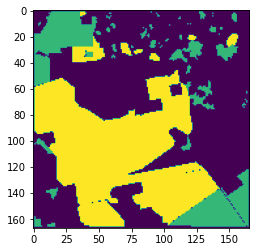

In [318]:
plt.imshow(seg)

# Compare different zones

In [128]:
def get_features_from_superpixels(labels, image, colored_labels):
    nb_labels = len(np.unique(labels))
    X = np.zeros((nb_labels, 3))
    dic_labels = {}
    for i in range(nb_labels):
      dic_labels[i] = image[labels==i]

    for l in dic_labels.keys():
        X[l, :3] = np.mean(dic_labels[l], axis=0)
        # X[l, 3:6] = np.var(dic_labels[l], axis=0)
        # X[l, 6:9], X[l, 9:12] = np.min(dic_labels[l], axis=0), np.max(dic_labels[l], axis=0)
        # X[l, 12] = dic_labels[l].shape[0]

    X[X!=X]=10 # Retirer valeurs NaN
    return X

def get_matrice_from_superpixels(labels,image):
    nb_labels = len(np.unique(labels))
    labels_colored = color.label2rgb(labels+1, image, kind='avg')
    print('Number of superpixels: ', nb_labels)
    X = np.zeros((nb_labels, 3))
    for i in range(labels.shape[0]):
      for j in range(labels.shape[1]):
        if True in np.isnan(labels_colored[i,j]):
          X[labels[i,j]-1, :] = (10, 10, 10)
        else:
          X[labels[i,j]-1, :] = labels_colored[i,j]
    return X


def normalize_img(img):
    return (img - np.nanmin(img))/(np.nanmax(img) - np.nanmin(img))

def get_gt(path_img, site):
    raster = rasterio.open(path_foret+ path_img)
    polygon_list = parse_kml_polygon(path+'/kmls/Site_00' + str(site) +'.kml')
    seg = segmentation_mask(raster, polygon_list, categ_values=category_values_lower)
    return seg

In [129]:
import scipy

def extract_filters(sigmas, img, ndvi):   

    img_lab = color.rgb2lab(img) #Convert RGB to label
    r_channel = img_lab[:,:,0]
    g_channel = img_lab[:, :,1]
    b_channel = img_lab[:, : ,2]

    list_filters = []
    for sigma in sigmas:
        #Gaussian filter on each channel
        gauss_filt_r = scipy.ndimage.gaussian_filter(r_channel, sigma)
        gauss_filt_g = scipy.ndimage.gaussian_filter(g_channel, sigma)
        gauss_filt_b = scipy.ndimage.gaussian_filter(b_channel, sigma)
        
        #Derivative of Gaussian on the x-direction
        dog_x_filt_r = scipy.ndimage.gaussian_filter(r_channel, sigma,(0,1))
        dog_x_filt_g = scipy.ndimage.gaussian_filter(g_channel, sigma, (0,1))
        dog_x_filt_b = scipy.ndimage.gaussian_filter(b_channel, sigma, (0,1))
    
        #Derivative of Gaussian on the y-direction
        dog_y_filt_r = scipy.ndimage.gaussian_filter(r_channel, sigma,(1,0))
        dog_y_filt_g = scipy.ndimage.gaussian_filter(g_channel, sigma, (1,0))
        dog_y_filt_b = scipy.ndimage.gaussian_filter(b_channel, sigma, (1,0))
        
        #Laplacian of Gaussian
        log_filt_r = scipy.ndimage.gaussian_laplace(r_channel, sigma)
        log_filt_g = scipy.ndimage.gaussian_laplace(g_channel, sigma)
        log_filt_b = scipy.ndimage.gaussian_laplace(b_channel, sigma)

        #NDVI
        laplacian_ndvi = scipy.ndimage.gaussian_laplace(ndvi, sigma)
        dog_y_filt_ndvi = scipy.ndimage.gaussian_filter(ndvi, sigma,(1,0))
        dog_x_filt_ndvi = scipy.ndimage.gaussian_filter(ndvi, sigma,(0,1))
              
        #Stack the channels :  h x w x 3
        gauss_filt_rgb = np.dstack((gauss_filt_r, gauss_filt_g, gauss_filt_b))
        dog_x_filt_rgb = np.dstack((dog_x_filt_r, dog_x_filt_g, dog_x_filt_b))
        dog_y_filt_rgb = np.dstack((dog_y_filt_r, dog_y_filt_g, dog_y_filt_b))
        log_filt_rgb = np.dstack((log_filt_r, log_filt_g, log_filt_b))

        

        #Stack filters : (h, w, 3 x nb_filters)
        filters = np.dstack((gauss_filt_rgb, dog_x_filt_rgb, dog_y_filt_rgb, log_filt_rgb, laplacian_ndvi, dog_y_filt_ndvi, dog_x_filt_ndvi))
        #filters = np.dstack((gauss_filt_rgb, dog_x_filt_rgb, dog_y_filt_rgb, log_filt_rgb))
        list_filters.append(filters)


    #Stack filters for different values of sigma : (h, w, 3 x nb_sigmas x nb_filters)
    stacked_filters = np.dstack(list_filters)

    d=stacked_filters.shape[0]*stacked_filters.shape[1]
    stacked_filters=stacked_filters.reshape((d,-1))        
    return stacked_filters

In [138]:
img_dir = path_foret + '/Site_001/s1'
year = 2019
num_classes = 6
t = 'T1'

image_VH = compute_mean_img(img_dir, t, year, polar = 'VH')[:,:,0]
image_VV = compute_mean_img(img_dir, t, year, polar = 'VV')[:,:,0]
im = np.zeros([image_VV.shape[0], image_VV.shape[1], 3])
im[:,:,0] = normalize_img(image_VV)
im[:,:,1] = normalize_img(image_VH)
ratio = image_VV/(image_VH + 1E-5)
im[:,:,2] = normalize_img(ratio)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: Mean of empty slice


In [139]:
im[:,:,2]

array([[           nan, 1.23420106e-05, 1.18303791e-05, ...,
        9.93359040e-06, 1.21160455e-05, 1.42179227e-05],
       [           nan, 1.60936185e-05, 1.43482166e-05, ...,
        1.18871770e-05, 1.41519779e-05, 1.46043545e-05],
       [           nan, 1.35636126e-05, 1.29049907e-05, ...,
        1.38301089e-05, 1.54402459e-05, 1.59894250e-05],
       ...,
       [2.31798103e-05, 2.20877347e-05, 2.01261226e-05, ...,
        1.95505134e-05, 2.24517715e-05, 2.29822458e-05],
       [2.26504405e-05, 1.98077428e-05, 1.74072244e-05, ...,
        1.92467999e-05, 1.83650071e-05, 1.89784914e-05],
       [2.19380512e-05, 1.94641885e-05, 1.79088721e-05, ...,
        2.54689030e-05, 2.26354680e-05, 2.14335349e-05]])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.
  if __name__ == '__main__':
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


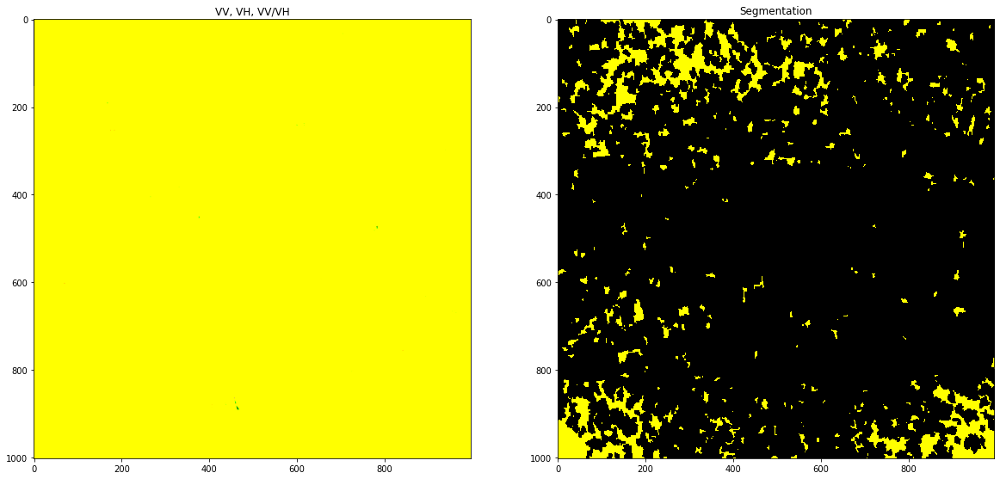

In [123]:

# Procédure
fz = felzenszwalb(im, scale=10, sigma=1, min_size=50)
colored_label = color.label2rgb(fz+1, im, kind='avg')
X = get_features_from_superpixels(fz, im, colored_label)
Y_k = KMeans(num_classes).fit_predict(X)
fz.dtype = int
fz_k = Y_k[fz-1]   
im_segmented = color.label2rgb(fz_k+1, im, kind='avg')
# Plot
fig = plt.figure(figsize=(20,10))
ax1 = fig.add_subplot(1,2,1)
ax1.imshow(im)
ax1.set_title("VV, VH, VV/VH")
ax2 = fig.add_subplot(1,2,2)
ax2.imshow(im_segmented)
ax2.set_title("Segmentation")
plt.show()


In [ ]:
raster = rasterio.open(path_foret+ '/Site_003/s2/2020-01-03T09_54_01Z/B01.tiff')
polygon_list = parse_kml_polygon(path_foret+'/kmls/Site_003.kml')
seg = segmentation_mask(raster, polygon_list, categ_values=category_values_lower)
plt.figure(figsize=(8,8))
plt.imshow(seg)

In [119]:
np.max(im[:,:,2])

nan

Idée : utiliser GLCM mais comment ? Superpixels pas carrés

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.


Number of superpixels:  5637


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.


Reading file /content/drive/MyDrive/MVA/Projet Remote Sensing/MVA_project_bananiers//kmls/Site_001.kml
skipped footprint


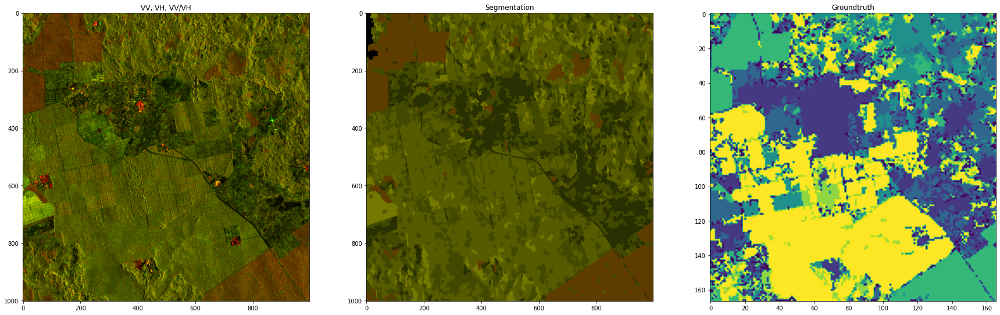

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.


Number of superpixels:  1444


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.


Reading file /content/drive/MyDrive/MVA/Projet Remote Sensing/MVA_project_bananiers//kmls/Site_002.kml
skipped footprint


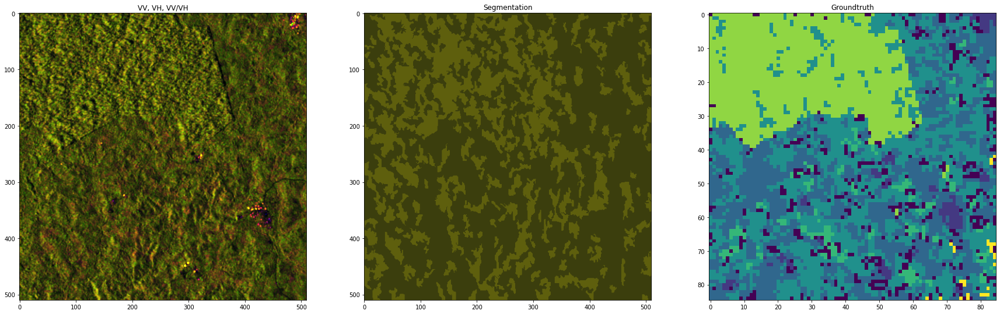

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.


Number of superpixels:  5731


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.


Reading file /content/drive/MyDrive/MVA/Projet Remote Sensing/MVA_project_bananiers//kmls/Site_003.kml


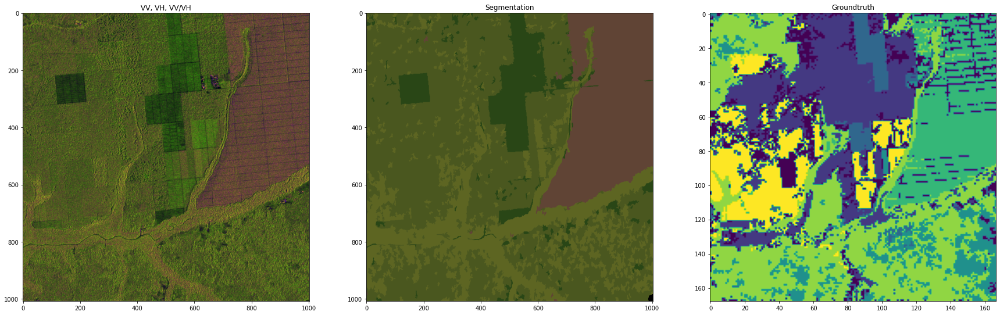

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.


Number of superpixels:  4940


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.


Reading file /content/drive/MyDrive/MVA/Projet Remote Sensing/MVA_project_bananiers//kmls/Site_004.kml
skipped footprint


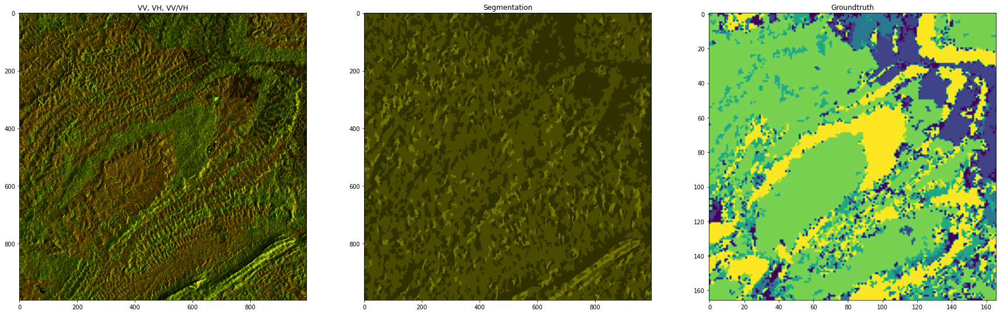

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.


Number of superpixels:  5293


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.


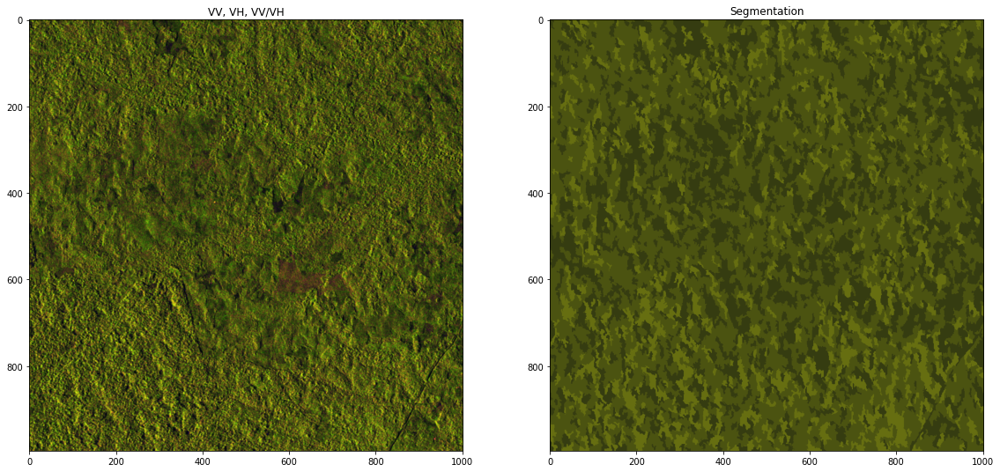

In [135]:
dirs = [path_foret + '/Site_001/s1', path_foret + '/Site_002/s1', path_foret + '/Site_003/s1', path_foret + '/Site_004/s1', path_foret + '/Site_005/s1']
paths_gt = ['/Site_001/s2/2019-01-20T10_33_41Z/B01.tiff', '/Site_002/s2/2020-04-21T10_20_21Z/B01.tiff', '/Site_003/s2/2020-01-03T09_54_01Z/B01.tiff', '/Site_004/s2/2019-03-02T02_26_19Z/B01.tiff', None]
years = [2019, 2020, 2020, 2019, 2019]
num_classes = [6, 2, 5, 3, 3]
t = 'T1'

# Procédure
def clustering_kmean_fz(img_dir, year, num_classes, t, path_gt, site):
    # Compute img
    image_VH = compute_mean_img(img_dir, t, year, polar = 'VH')[:,:,0]
    image_VV = compute_mean_img(img_dir, t, year, polar = 'VV')[:,:,0]
    im = np.zeros([image_VV.shape[0], image_VV.shape[1], 3])
    im[:,:,0] = normalize_img(image_VV)
    im[:,:,1] = normalize_img(image_VH)
    im[:,:,2] = normalize_img(image_VV/(image_VH+1e-10))

    # Clustering
    fz = felzenszwalb(im, scale=10, sigma=1, min_size=50)
    X = get_matrice_from_superpixels(fz, im)
    Y_k = KMeans(num_classes).fit_predict(X)
    fz.dtype = int
    fz_k = Y_k[fz-1]
    im_segmented = color.label2rgb(fz_k, im, kind='avg')

    # Groundtruth
    if path_gt is not None:
      im_gt = get_gt(path_gt, site)

    # Plot
    fig = plt.figure(figsize=(30,10))
    ax1 = fig.add_subplot(1,3,1)
    ax1.imshow(im)
    ax1.set_title("VV, VH, VV/VH")
    ax2 = fig.add_subplot(1,3,2)
    ax2.imshow(im_segmented)
    ax2.set_title("Segmentation")
    if path_gt is not None:
      ax3 = fig.add_subplot(1,3,3)
      ax3.imshow(im_gt)
      ax3.set_title("Groundtruth")
    plt.show()
    return fz

for i in range(len(dirs)):
    clustering_kmean_fz(dirs[i], years[i], num_classes[i], t, paths_gt[i], i+1)

Reading file /content/drive/MyDrive/MVA/Projet Remote Sensing/MVA_project_bananiers//kmls/Site_002.kml
skipped footprint


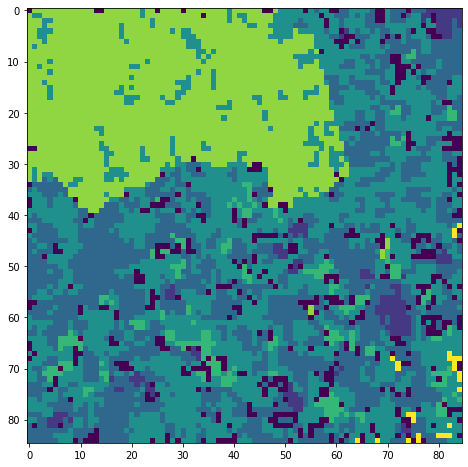

In [125]:
raster = rasterio.open(path_foret+ '/Site_002/s2/2020-04-21T10_20_21Z/B01.tiff')
polygon_list = parse_kml_polygon(path+'/kmls/Site_002.kml')
seg = segmentation_mask(raster, polygon_list, categ_values=category_values_lower)
plt.figure(figsize=(8,8))
plt.imshow(seg)

In [ ]:
fname = 'Site_001/s1/2019-01-14T18_33_37Z/iw-vh.tiff'

with rasterio.open(fname) as src:
    img = src.read()